# Image colorization with Autoenoder and GANs

## problems with RGB and possible improvement
RGB images represent sensor data more, which is sensitive to different wavelengths of light. And that is how humans perceive colors. But translated into squared distance, the algorithm would likely to settle for an average distance that minimizes the MSE but doesn't help with improving visual perceptions.

As a non-absolute color space, the distance between colors in RGB color space is not directly related to their perceptual difference, which makes using RGB color space less effective when it comes to images that require visual identifications.

Alternative - using lab colour space representation instead of RBG which simplifies the problem and requires you to predict two output channels instead of three

In [ ]:
from matplotlib import transforms
#lab color space
HORSE_CATEGORY = 7
from skimage.color import rgb2lab, lab2rgb
def process_lab(xs, ys, downsize_input=False):

    xs = xs[np.where(ys == HORSE_CATEGORY)[0], :, :, :]
    npr.shuffle(xs)
    xs = np.transpose(xs, [0, 2,3,1])
    lab = rgb2lab(xs)
    l = lab[:,:,:,0:1] / 50. - 1.
    ab = lab[:,:,:,1:3] / 110.
    l = np.transpose(l,[0,3,1,2])
    ab = np.transpose(ab,[0,3,1,2])
    #rgb = lab2rgb(lab)
    #rgb = np.transpose(rgb,[0,3,1,2])
    #rgb = xs/256.0
    #rgb = np.transpose(rgb, [0,3,1,2])
    return (ab, l)

In [ ]:
(x_train, y_train), (x_test, y_test) = load_cifar10()

File path: data/cifar-10-batches-py.tar.gz


In [ ]:
ab, l= process_lab(x_train, y_train)

In [ ]:
com = np.zeros((5000,3,32,32))
com[:,0:1,:,:]=(l+1.)*50.
com[:,1:3,:,:]=ab*110.
com=lab2rgb(np.transpose(com,[0,2,3,1]))

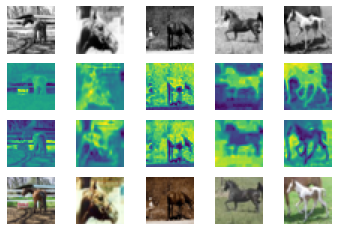

In [ ]:
#visualization
img_grey = np.transpose(l[:5, :, :, :], [0, 2, 3, 1]).squeeze()
img_a = np.transpose(ab[:5, 0:1, :, :], [0, 2, 3, 1]).squeeze()
img_b = np.transpose(ab[:5, 1:2, :, :], [0, 2, 3, 1]).squeeze()
rgb =com[:5, :, :, :]
for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    ax.imshow(img_grey[i], cmap='gray')
    ax.axis('off')
    ax = plt.subplot(4, 5, i + 1 + 5)
    ax.imshow(img_a[i])
    ax.axis('off')
    ax = plt.subplot(4, 5, i + 1 + 10)
    ax.imshow(img_b[i])
    ax.axis('off')
    ax = plt.subplot(4, 5, i + 1 + 15)
    ax.imshow(rgb[i])
    ax.axis('off')
plt.show()

In [ ]:
#test on unet

class UNet_t(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=2, num_in_channels=1):
        super().__init__()

        # parameters
        stride = 2
        padding = kernel // 2
        output_padding = 1

        self.conv1=nn.Conv2d(1, num_filters, kernel, stride=2, padding=padding)
        self.conv2=nn.Conv2d(num_filters, num_filters*2, kernel, stride=2, padding=padding)
        self.conv3=nn.Conv2d(num_filters*2, num_filters*4, kernel, stride=2, padding=padding)
        self.conv=nn.Conv2d(num_filters*4, num_filters*2,1, stride=1, padding=0)
        self.conv0=nn.Conv2d(num_filters*2, num_filters,1, stride=1, padding=0)
        self.conv4=nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel,stride=2, padding=padding, output_padding = 1)
        self.conv5=nn.ConvTranspose2d(num_filters*2, num_filters, kernel, stride=2, padding=padding, output_padding = 1)
        self.conv6=nn.ConvTranspose2d(num_filters, 2, kernel, stride=2, padding=padding, output_padding = 1)

    def forward(self, x):
        
        out1 = F.relu(self.conv1(x)) #32, 16,16
        out2 = F.relu(self.conv2(out1))
        
        out3 = F.relu(self.conv3(out2)) #bottle-neck 128,4,4
        out4 = F.relu(self.conv4(out3)) #64,8,8

        concat1 = torch.cat((out4,out2), dim=1) # 128,8,8
        out5_skip=F.relu(self.conv(concat1)) #64,8,8
        out5 = F.relu(self.conv5(out5_skip)) #32,16,16
        concat2 = torch.cat((out5,out1), dim=1)
        out6_skip=F.relu(self.conv0(concat2))
        out6 = self.conv6(out6_skip)
        out=F.sigmoid(out6)

        return out

In [ ]:
def get_torch_vars_lab(xs, ys, gpu=False):

    xs = torch.from_numpy(xs).float()
    ys = torch.from_numpy(ys).float()
    #zs = torch.from_numpy(zs).float()
    if gpu:
        xs = xs.cuda()
        ys = ys.cuda()
     #   zs = zs.cuda()
    return Variable(xs), Variable(ys)#, Variable(zs)
def get_batch_lab(x, y, batch_size):

    N = np.shape(x)[0]
    assert N == np.shape(y)[0]
    for i in range(0, N, batch_size):
        batch_x = x[i : i + batch_size, :, :, :]
        batch_y = y[i : i + batch_size, :, :, :]
        yield (batch_x, batch_y)
def visual_lab(img_grey, img_lab, img_fake, args):
  img_grey = img_grey.cpu().detach().numpy()
  img_lab = img_lab.cpu().detach().numpy()
  img_fake = img_fake.cpu().detach().numpy()
  pic_1 = np.zeros((args.batch_size,3,32,32))
  pic_1[:,0:1,:,:]=(img_grey+1.)*50.
  pic_1[:,1:3,:,:]=img_lab*110.
  img_real=lab2rgb(np.transpose(pic_1,[0,2,3,1]))
  pic_2 = np.zeros((args.batch_size,3,32,32))
  pic_2[:,0:1,:,:]=(img_grey+1.)*50.
  pic_2[:,1:3,:,:]=img_fake*110.
  img_fake=lab2rgb(np.transpose(pic_2,[0,2,3,1]))
  #correct image structure
  img_grey = np.transpose(img_grey[:5, :, :, :], [0, 2, 3, 1]).squeeze()
  img_real = img_real[:5, :, :, :]
  img_fake = img_fake[:5, :, :, :]

  for i in range(5):
      ax = plt.subplot(3, 5, i + 1)
      ax.imshow(img_grey[i], cmap='gray')
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 5)
      ax.imshow(img_real[i])
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 10)
      ax.imshow(img_fake[i])
      ax.axis("off")
  plt.show()

def train_lab(args, gen=None):

    # Numpy random seed
    npr.seed(args.seed)

    # Save directory
    save_dir = "outputs/" + args.experiment_name

    # LOAD THE MODEL
    if gen is None:
        Net = globals()[args.model]
        gen = Net(args.kernel, args.num_filters)

    # LOSS FUNCTION
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(gen.parameters(), lr=args.learn_rate)

    # DATA
    print("Loading data...")
    (x_train, y_train), (x_test, y_test) = load_cifar10()

    print("Transforming data...")
    train_ab, train_grey = process_lab(x_train, y_train, downsize_input=args.downsize_input)
    test_ab, test_grey = process_lab(x_test, y_test, downsize_input=args.downsize_input)

    # Create the outputs folder if not created already
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    print("Beginning training ...")
    if args.gpu:
        gen.cuda()
    start = time.time()

    train_losses = []
    valid_losses = []
    valid_accs = []
    for epoch in range(args.epochs):
        # Train the Model
        gen.train()  # Change model to 'train' mode
        losses = []
        for i, (xs, ys) in enumerate(get_batch_lab(train_grey, train_ab, args.batch_size)):
            images, lab= get_torch_vars_lab(xs, ys, args.gpu)

            optimizer.zero_grad()
            outputs = gen(images)

            loss = criterion(outputs, lab)
            loss.backward()
            optimizer.step()
            losses.append(loss.data.item())

        train_losses.append(np.sum(losses)/(i+1))

        print(epoch, loss.cpu().detach())
        if args.plot:
          visual_lab(images, lab, outputs,args)
    
    return gen

In [ ]:
args = AttrDict()
args_dict = {
    "gpu": True,
    "valid": False,
    "checkpoint": "",
    "colours": "./data/colours/colour_kmeans24_cat7.npy",
    "model": "UNet_t",
    "kernel": 3,
    "num_filters": 32,
    'learn_rate':0.001, 
    "batch_size": 100,
    "epochs": 80,
    "seed": 1,
    "plot": True,
    "experiment_name": "colourization_lab",
    "visualize": False,
    "downsize_input": False,
}
args.update(args_dict)
cnn= train_lab(args)
#Note: outputs are omitted due to file size restrictions

In [ ]:
class Generator_lab(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=2, num_in_channels=1):
        super().__init__()
        #self.label_emb = nn.Embedding(1, 10)
        #parameters
        stride = 2
        padding = kernel // 2
        output_padding = 1

       
        self.conv1=nn.Conv2d(1, num_filters, kernel, stride=2, padding=padding)
        self.conv2=nn.Conv2d(num_filters, num_filters*2, kernel, stride=2, padding=padding)
        self.conv3=nn.Conv2d(num_filters*2, num_filters*4, kernel, stride=2, padding=padding)
        self.conv=nn.Conv2d(num_filters*4, num_filters*2,1, stride=1, padding=0)
        self.conv0=nn.Conv2d(num_filters*2, num_filters,1, stride=1, padding=0)
        self.conv4=nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel,stride=2, padding=padding, output_padding = 1)
        self.conv5=nn.ConvTranspose2d(num_filters*2, num_filters, kernel, stride=2, padding=padding, output_padding = 1)
        self.conv6=nn.ConvTranspose2d(num_filters, 2, kernel, stride=2, padding=padding, output_padding = 1)
        self.tanh=nn.Tanh()
        

    def forward(self, x):
   
        out1 = F.relu(self.conv1(x)) #32, 16,16
        out2 = F.relu(self.conv2(out1))
        
        out3 = F.relu(self.conv3(out2)) #bottle-neck 128,4,4
        out4 = F.relu(self.conv4(out3)) #64,8,8

        concat1 = torch.cat((out4,out2), dim=1) # 128,8,8
        out5_skip=F.relu(self.conv(concat1)) #64,8,8
        out5 = F.relu(self.conv5(out5_skip)) #32,16,16
        concat2 = torch.cat((out5,out1), dim=1)
        out6_skip=F.relu(self.conv0(concat2))
        out6 = self.conv6(out6_skip)
  
        out=self.tanh(out6)   #(-1, 1) tanh      

        return out

In [ ]:
class Discriminator_lab(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=2, num_in_channels=3):
        super().__init__()
        
        # parameters
        #stride = 2
        padding = kernel // 2
        #output_padding = 1

      
        self.cov1 = nn.Conv2d(3, num_filters, kernel, stride=2, padding=padding) #34x34x3 - 16x16x32 
        self.cov2 = nn.Conv2d(num_filters, num_filters*2, kernel, stride=2, padding=padding) #8x8x64
        self.cov3 = nn.Conv2d(num_filters*2, num_filters*4, kernel, stride=2, padding=padding)
        #self.cov4 = nn.Conv2d(num_filters*4, num_filters*8, kernel, stride=2, padding=padding) 
        self.fc1 = nn.Linear(4*4*num_filters*4, 512)
        #self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        self.fc4 = nn.Linear(256, 1)
        self.lr=nn.LeakyReLU(0.2, inplace=True)
        self.do=nn.Dropout(0.3)
        self.sig=nn.Sigmoid()

    def forward(self, x, img_greyscale):
        
        
        out = torch.cat((x, img_greyscale),1) 
        out = self.do(self.lr(self.cov1(out)))
        out = self.do(self.lr(self.cov2(out)))
        out = self.do(self.lr(self.cov3(out)))
        #out = self.do(self.lr(self.cov4(out)))
        #print(out.shape)
        out = out.reshape(-1, 2048) 
        #print(out.shape)
        out = self.do(self.lr(self.fc1(out)))
        #out = self.do(self.lr(self.fc2(out)))
        out = self.do(self.lr(self.fc3(out)))
        out = self.sig(self.fc4(out))

        return out.squeeze()

In [ ]:
def get_model_name(name, epoch):
    path = "model_{0}_epoch{1}".format(name,
                                       epoch)
    return path
def train_gan_lab(args, cnn=None):
    # Set the maximum number of threads to prevent crash in Teaching Labs

    torch.set_num_threads(5)
    npr.seed(args.seed)

    save_dir = "outputs/" + args.experiment_name

    # LOAD THE COLOURS CATEGORIES

    # INPUT CHANNEL
    num_in_channels = 1 if not args.downsize_input else 3
    # LOAD THE MODEL
    if cnn is None:
        Net = globals()[args.model]
        cnn = Net(args.kernel, args.num_filters)
        discriminator = Discriminator_lab(args.kernel, args.num_filters)

    # LOSS FUNCTION

    criterion = nn.BCELoss()
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=1e-5)
    g_optimizer = torch.optim.Adam(cnn.parameters(), lr=1e-4)

    # DATA
    print("Loading data...")
    (x_train, y_train), (x_test, y_test) = load_cifar10()

    print("Transforming data...")
    train_ab, train_grey = process_lab(x_train, y_train, downsize_input=args.downsize_input)
    test_ab, test_grey = process_lab(x_test, y_test, downsize_input=args.downsize_input)

    # Create the outputs folder if not created already
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    print("Beginning training ...")
    if args.gpu:
        cnn.cuda()
        discriminator.cuda()
    start = time.time()

    train_losses = []
    valid_losses = []
    valid_accs = []
    for epoch in range(args.epochs):
        # Train the Model
        cnn.train()
        discriminator.train()
        losses = []
 
        for i, (xs, ys) in enumerate(get_batch(train_grey, train_ab, args.batch_size)):
            images, lab = get_torch_vars(xs, ys, args.gpu)

            #--->ADDED 5
            img_grey = images
            img_real = lab
            batch_size = args.batch_size
            
            #discriminator training
            d_optimizer.zero_grad()         
            fake_images = cnn(img_grey)
           # print(fake_images.shape)
            fake_validity = discriminator(fake_images, img_grey)
            #print(fake_validity.shape)
            fake_loss = criterion(fake_validity, Variable(torch.zeros(args.batch_size)).cuda())
            real_validity = discriminator(img_real, img_grey)
            real_loss = criterion(real_validity, Variable(torch.ones(args.batch_size)).cuda())   
            d_loss = real_loss + fake_loss
            d_loss.backward()
            d_optimizer.step()

            # generator training
            g_optimizer.zero_grad()
            fake_images = cnn(img_grey)
            validity = discriminator(fake_images, img_grey)
            g_loss = criterion(validity, Variable(torch.ones(args.batch_size)).cuda())
            g_loss.backward()
            g_optimizer.step()

        model_path_g = get_model_name(args.model, epoch)
        model_path_d = get_model_name('discriminator_lab', epoch)
        torch.save(cnn.state_dict(), model_path_g)
        torch.save(discriminator.state_dict(), model_path_d)
        # print and visualize
        print(epoch, g_loss.cpu().detach(), d_loss.cpu().detach())
        visual_lab(images, lab, fake_images, args)

    return cnn

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Loading data...
File path: data/cifar-10-batches-py.tar.gz
Transforming data...
Beginning training ...
0 tensor(0.6889) tensor(1.3786)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3532 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


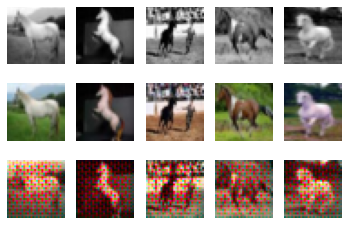

1 tensor(0.6894) tensor(1.3890)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 19 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


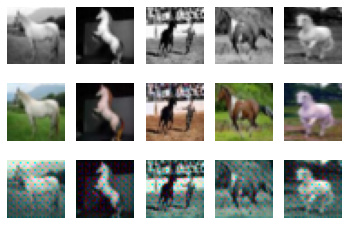

2 tensor(0.6814) tensor(1.3870)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1225 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


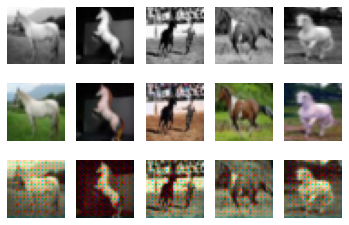

3 tensor(0.6859) tensor(1.3857)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 719 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


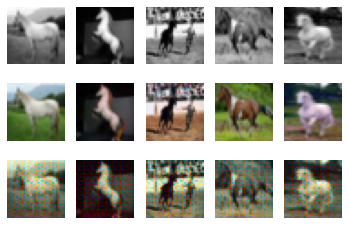

4 tensor(0.6851) tensor(1.3881)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 56 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


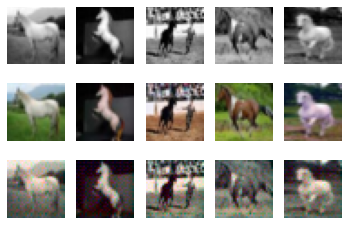

5 tensor(0.6870) tensor(1.3873)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 225 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


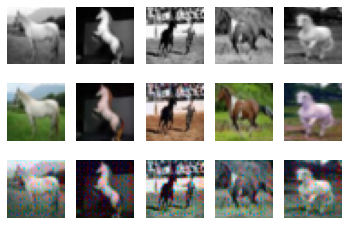

6 tensor(0.6861) tensor(1.3875)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 333 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


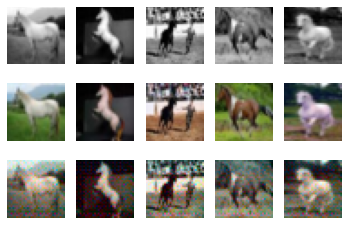

7 tensor(0.6871) tensor(1.3868)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 439 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


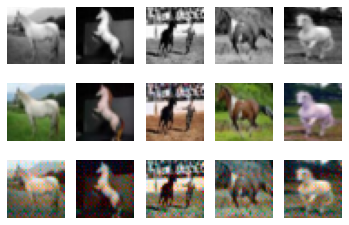

8 tensor(0.6874) tensor(1.3876)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 364 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


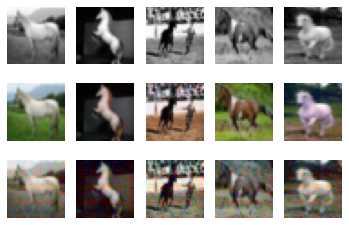

9 tensor(0.6865) tensor(1.3865)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 583 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


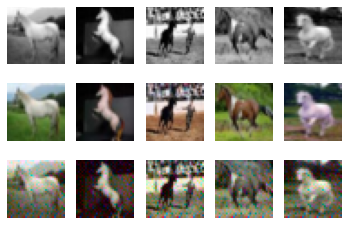

10 tensor(0.6884) tensor(1.3860)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 554 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


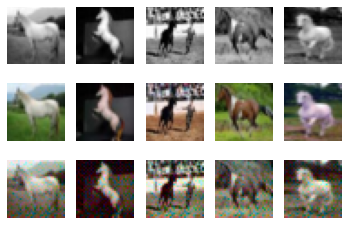

11 tensor(0.6905) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 527 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


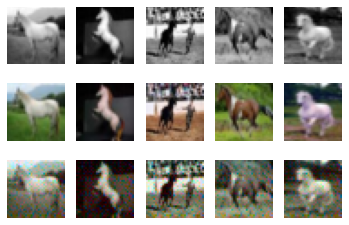

12 tensor(0.6893) tensor(1.3877)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 259 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


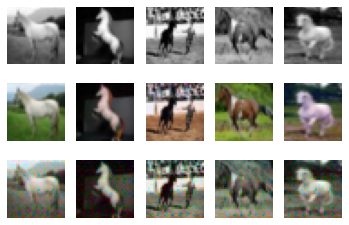

13 tensor(0.6914) tensor(1.3856)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 429 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


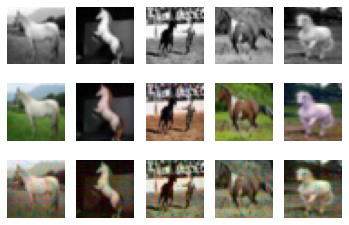

14 tensor(0.6899) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 605 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


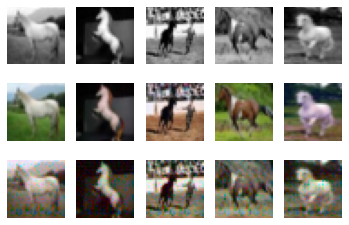

15 tensor(0.6898) tensor(1.3854)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 637 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


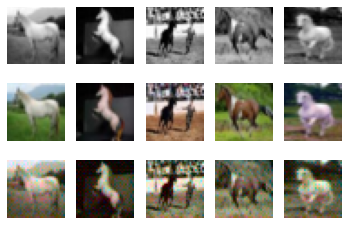

16 tensor(0.6920) tensor(1.3856)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 501 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


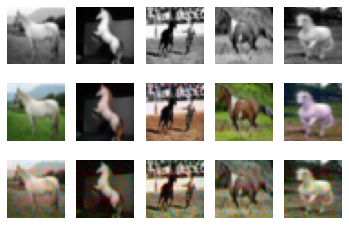

17 tensor(0.6909) tensor(1.3865)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 227 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


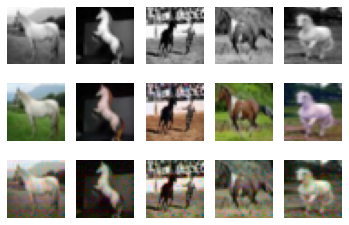

18 tensor(0.6915) tensor(1.3875)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 356 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


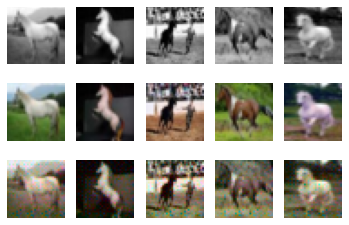

19 tensor(0.6909) tensor(1.3861)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 235 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


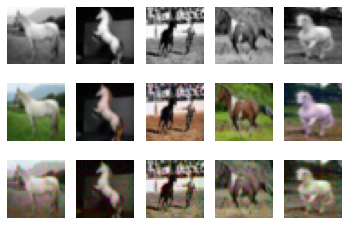

20 tensor(0.6916) tensor(1.3855)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 207 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


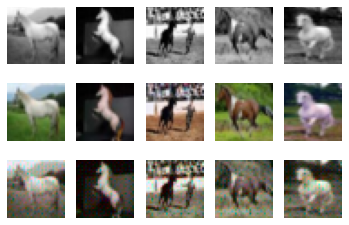

21 tensor(0.6922) tensor(1.3867)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 203 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


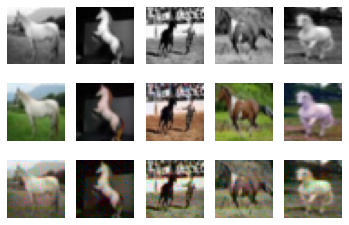

22 tensor(0.6922) tensor(1.3865)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 109 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


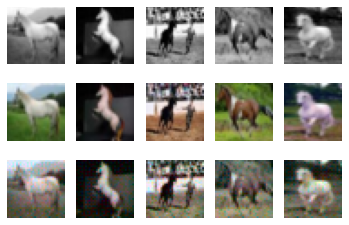

23 tensor(0.6919) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 188 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


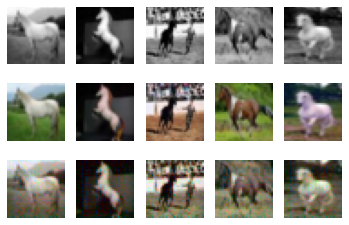

24 tensor(0.6921) tensor(1.3882)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 74 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


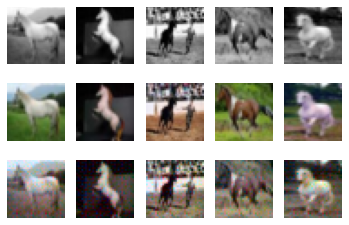

25 tensor(0.6936) tensor(1.3880)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 115 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


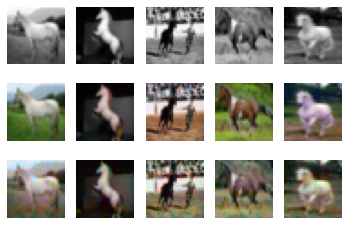

26 tensor(0.6917) tensor(1.3887)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 71 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


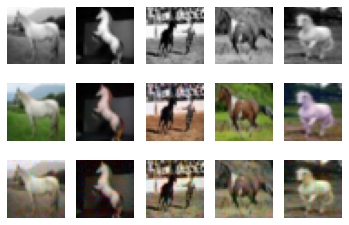

27 tensor(0.6911) tensor(1.3873)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 64 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


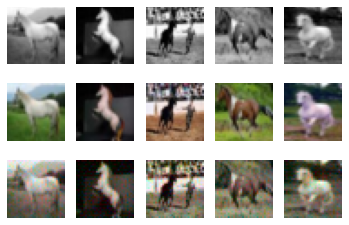

28 tensor(0.6918) tensor(1.3861)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 104 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


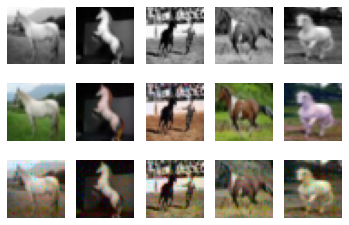

29 tensor(0.6930) tensor(1.3877)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 48 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


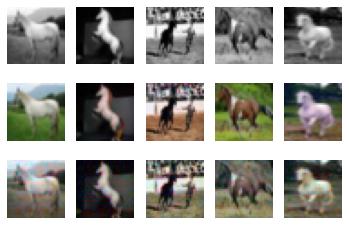

30 tensor(0.6917) tensor(1.3861)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 57 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


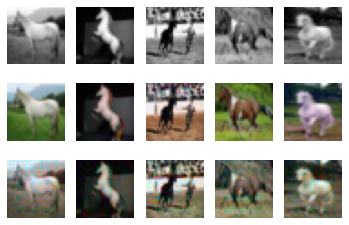

31 tensor(0.6912) tensor(1.3870)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 20 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


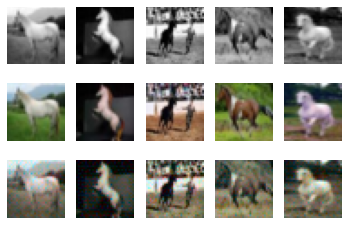

32 tensor(0.6920) tensor(1.3869)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 33 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


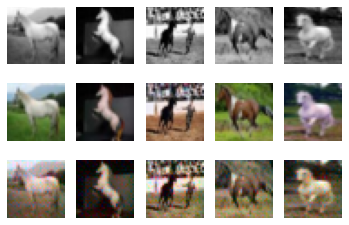

33 tensor(0.6918) tensor(1.3870)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 21 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


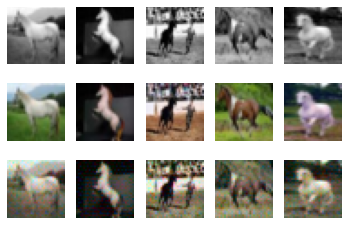

34 tensor(0.6917) tensor(1.3872)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 31 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


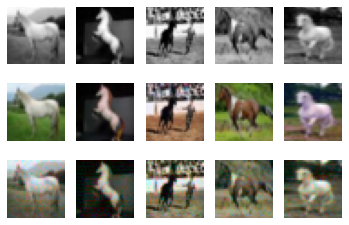

35 tensor(0.6927) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 240 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


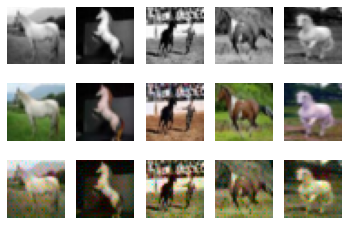

36 tensor(0.6927) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 47 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


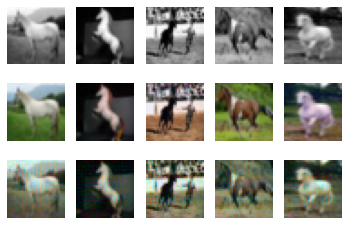

37 tensor(0.6920) tensor(1.3849)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


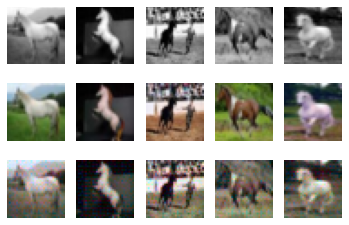

38 tensor(0.6916) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 27 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


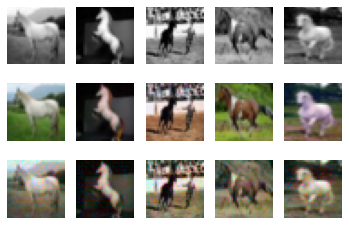

39 tensor(0.6930) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


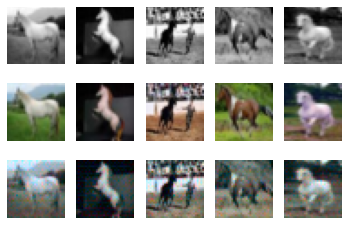

40 tensor(0.6925) tensor(1.3857)


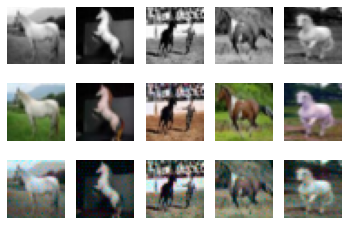

41 tensor(0.6927) tensor(1.3875)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 485 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


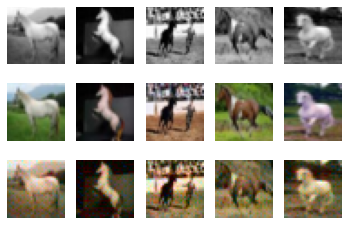

42 tensor(0.6915) tensor(1.3883)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 55 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


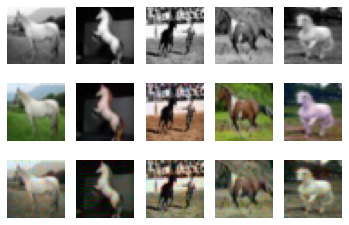

43 tensor(0.6940) tensor(1.3871)


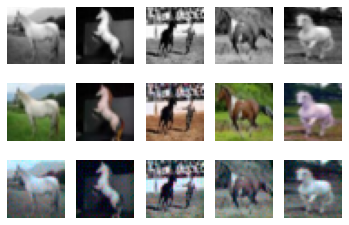

44 tensor(0.6919) tensor(1.3873)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1116 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


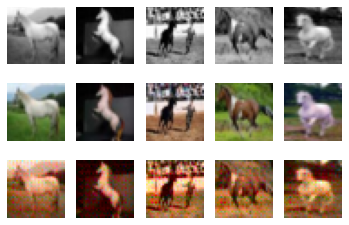

45 tensor(0.6932) tensor(1.3855)


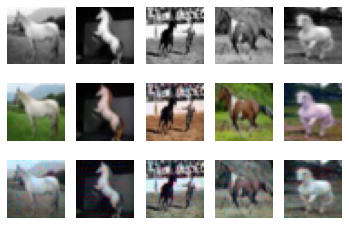

46 tensor(0.6938) tensor(1.3869)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 65 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


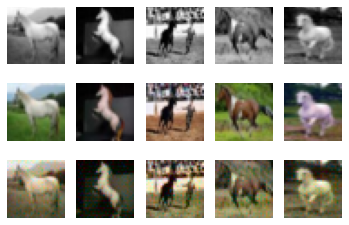

47 tensor(0.6920) tensor(1.3864)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


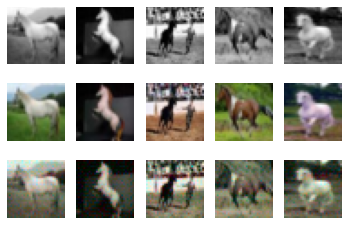

48 tensor(0.6923) tensor(1.3874)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 26 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


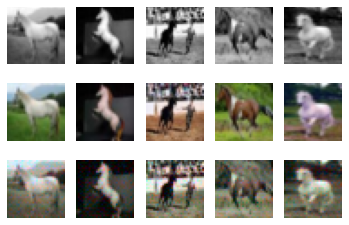

49 tensor(0.6925) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 59 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


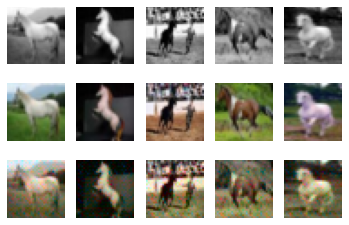

50 tensor(0.6931) tensor(1.3867)


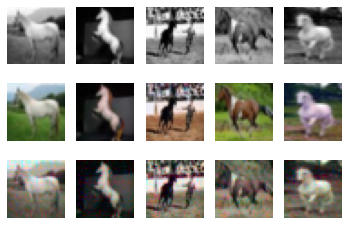

51 tensor(0.6924) tensor(1.3870)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 67 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


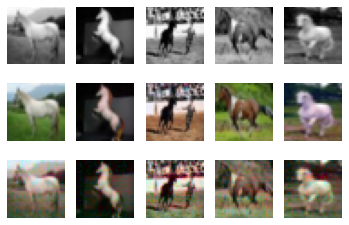

52 tensor(0.6929) tensor(1.3854)


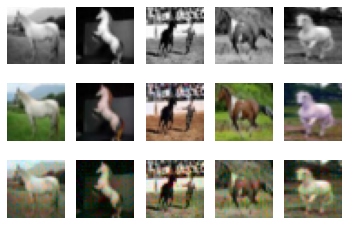

53 tensor(0.6919) tensor(1.3870)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


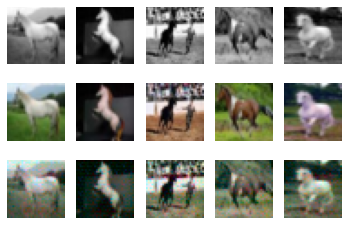

54 tensor(0.6925) tensor(1.3865)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


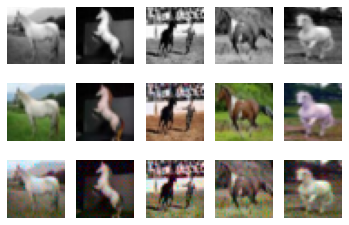

55 tensor(0.6922) tensor(1.3875)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 7 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


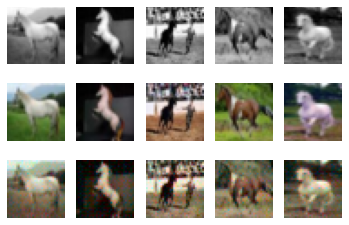

56 tensor(0.6935) tensor(1.3844)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


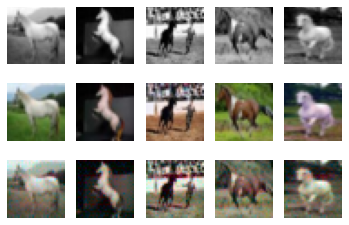

57 tensor(0.6925) tensor(1.3870)


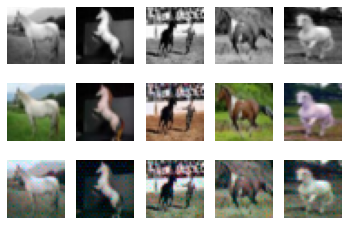

58 tensor(0.6933) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 61 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


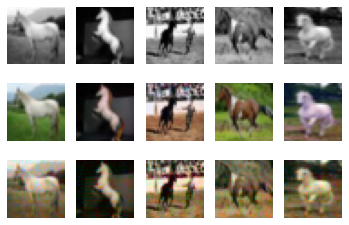

59 tensor(0.6936) tensor(1.3865)


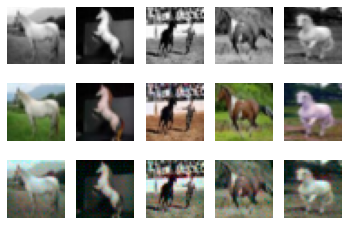

60 tensor(0.6942) tensor(1.3847)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 209 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


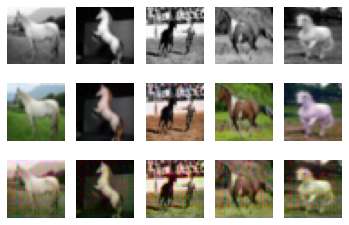

61 tensor(0.6924) tensor(1.3867)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 18 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


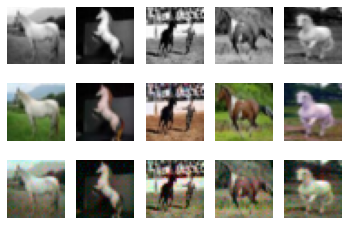

62 tensor(0.6940) tensor(1.3865)


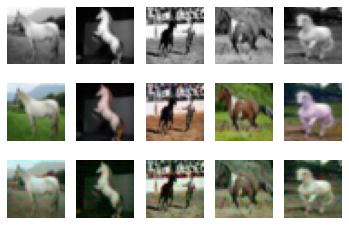

63 tensor(0.6913) tensor(1.3859)


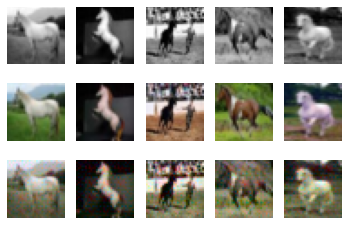

64 tensor(0.6926) tensor(1.3867)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


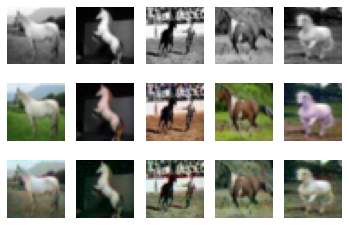

65 tensor(0.6933) tensor(1.3857)


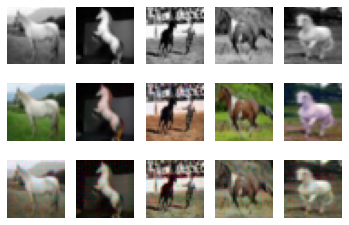

66 tensor(0.6942) tensor(1.3871)


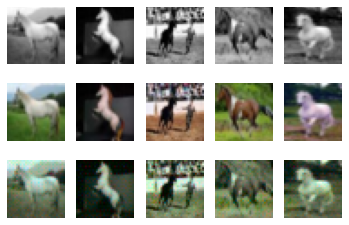

67 tensor(0.6929) tensor(1.3866)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


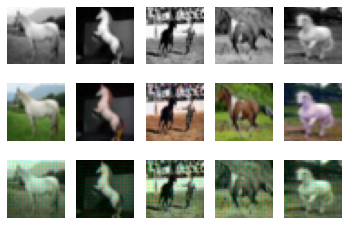

68 tensor(0.6926) tensor(1.3849)


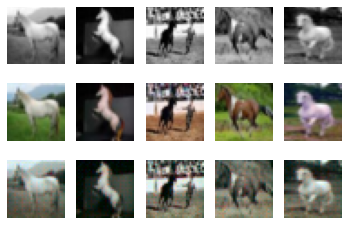

69 tensor(0.6926) tensor(1.3872)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 9 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


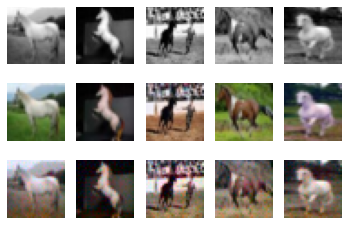

70 tensor(0.6939) tensor(1.3874)


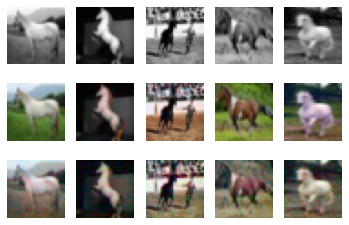

71 tensor(0.6925) tensor(1.3864)


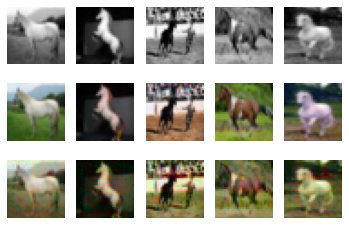

72 tensor(0.6928) tensor(1.3850)


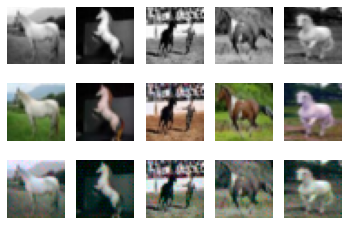

73 tensor(0.6932) tensor(1.3861)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 81 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


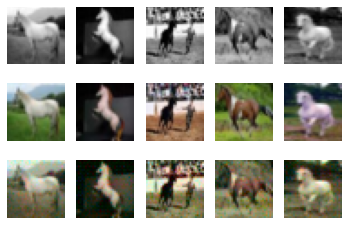

74 tensor(0.6927) tensor(1.3858)


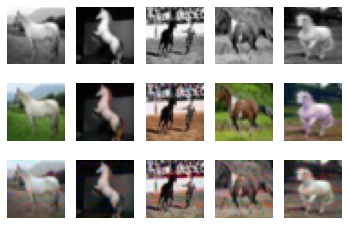

75 tensor(0.6918) tensor(1.3860)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 66 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


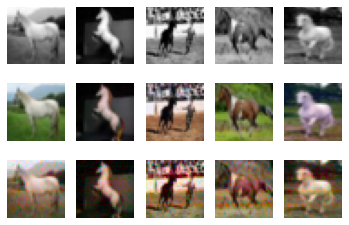

76 tensor(0.6934) tensor(1.3866)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


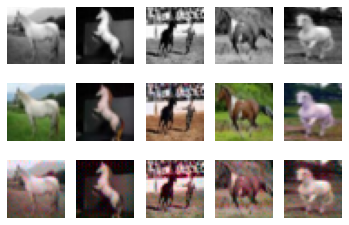

77 tensor(0.6939) tensor(1.3880)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 34 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


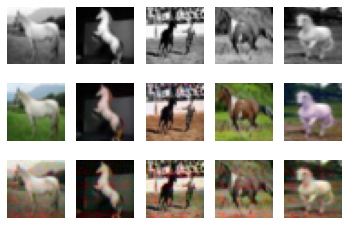

78 tensor(0.6928) tensor(1.3866)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 28 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


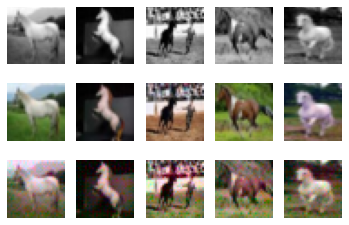

79 tensor(0.6930) tensor(1.3863)


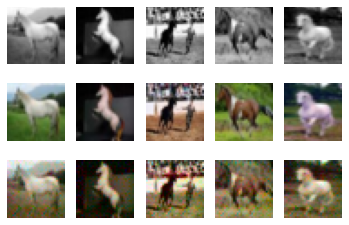

80 tensor(0.6932) tensor(1.3872)


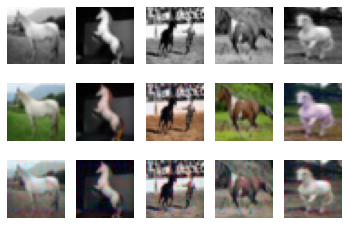

81 tensor(0.6927) tensor(1.3881)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


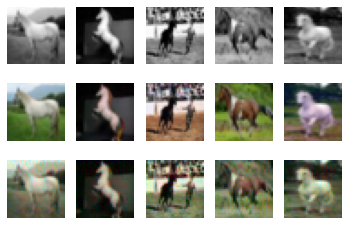

82 tensor(0.6936) tensor(1.3855)


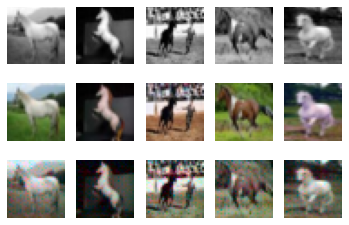

83 tensor(0.6935) tensor(1.3847)


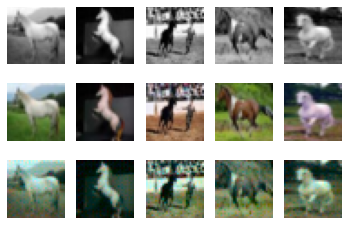

84 tensor(0.6922) tensor(1.3865)


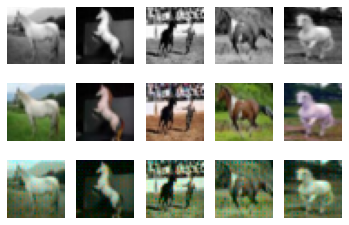

85 tensor(0.6926) tensor(1.3862)


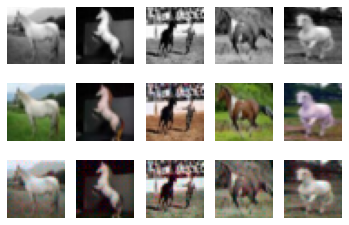

86 tensor(0.6931) tensor(1.3852)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 22 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


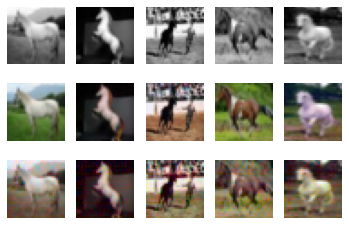

87 tensor(0.6934) tensor(1.3872)


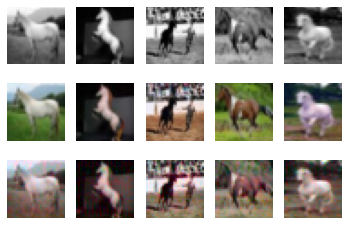

88 tensor(0.6929) tensor(1.3863)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 14 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


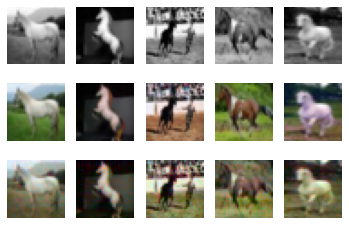

89 tensor(0.6924) tensor(1.3881)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


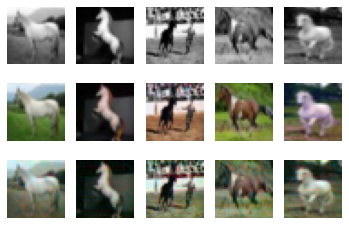

90 tensor(0.6923) tensor(1.3874)


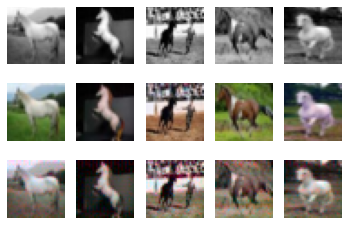

91 tensor(0.6932) tensor(1.3855)


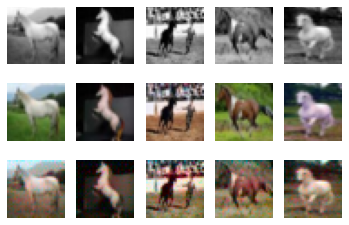

92 tensor(0.6923) tensor(1.3863)


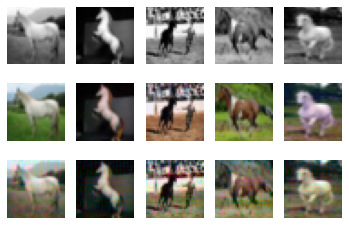

93 tensor(0.6928) tensor(1.3862)


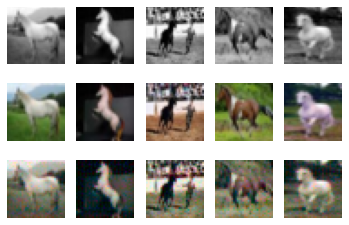

94 tensor(0.6934) tensor(1.3863)


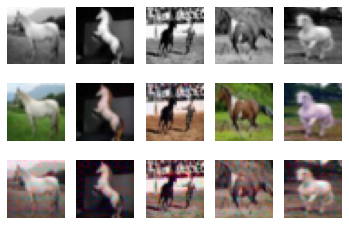

95 tensor(0.6934) tensor(1.3879)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 80 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


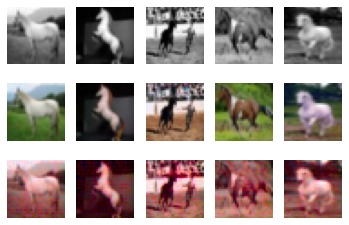

96 tensor(0.6930) tensor(1.3864)


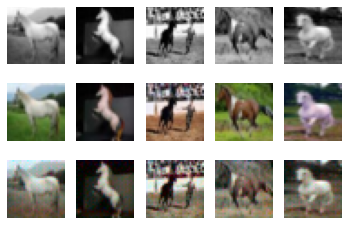

97 tensor(0.6933) tensor(1.3855)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 173 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


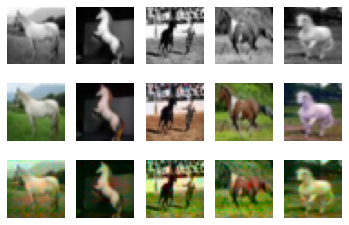

98 tensor(0.6934) tensor(1.3873)


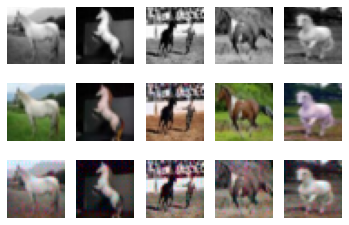

99 tensor(0.6921) tensor(1.3855)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 93 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


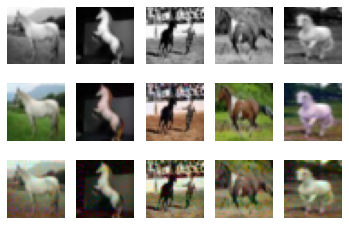

100 tensor(0.6932) tensor(1.3872)


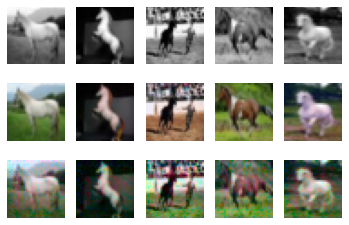

101 tensor(0.6916) tensor(1.3865)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 155 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


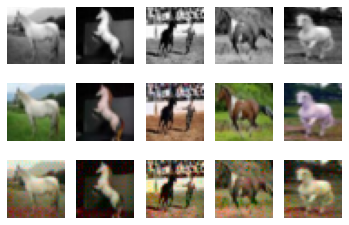

102 tensor(0.6930) tensor(1.3869)


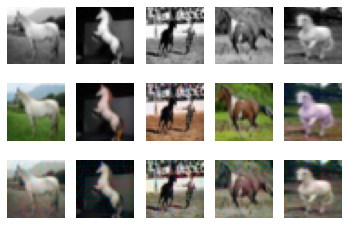

103 tensor(0.6937) tensor(1.3864)


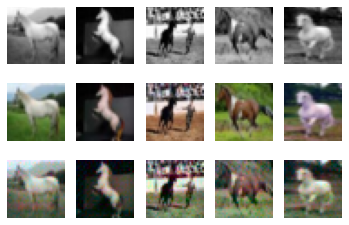

104 tensor(0.6941) tensor(1.3866)


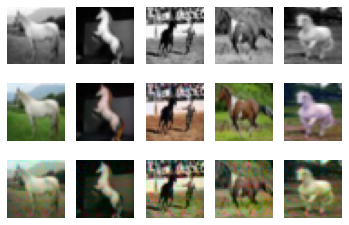

105 tensor(0.6930) tensor(1.3866)


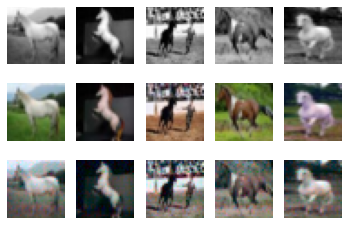

106 tensor(0.6928) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 24 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


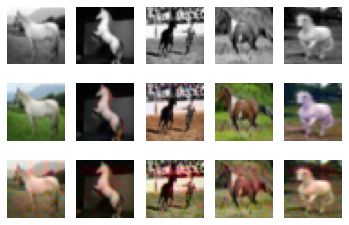

107 tensor(0.6933) tensor(1.3870)


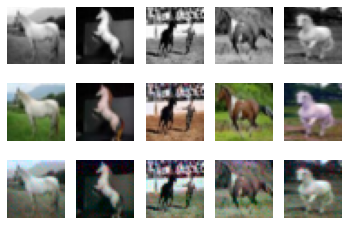

108 tensor(0.6924) tensor(1.3869)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 156 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


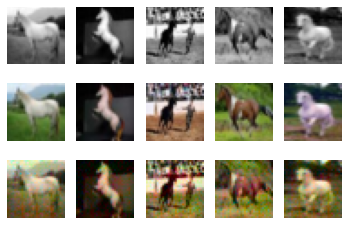

109 tensor(0.6928) tensor(1.3869)


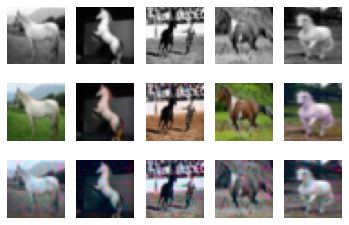

110 tensor(0.6926) tensor(1.3858)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 396 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


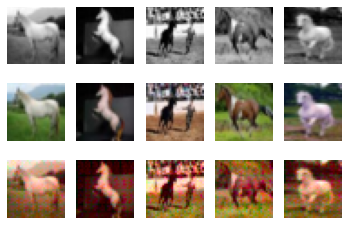

111 tensor(0.6931) tensor(1.3851)


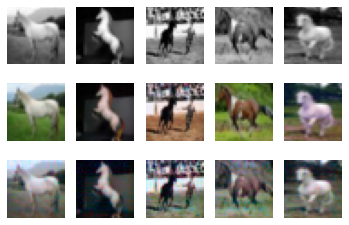

112 tensor(0.6931) tensor(1.3875)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 38 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


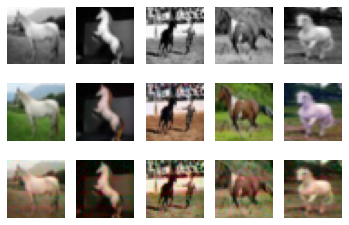

113 tensor(0.6933) tensor(1.3870)


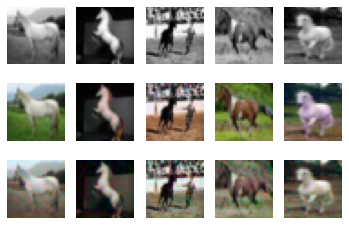

114 tensor(0.6938) tensor(1.3871)


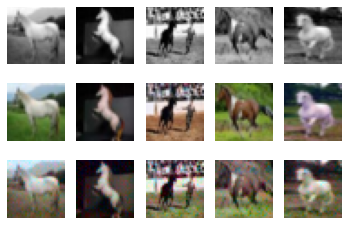

115 tensor(0.6919) tensor(1.3868)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 53 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


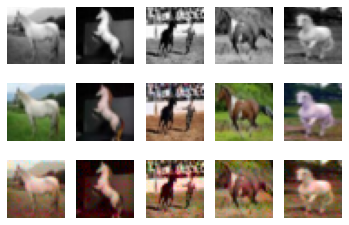

116 tensor(0.6935) tensor(1.3863)


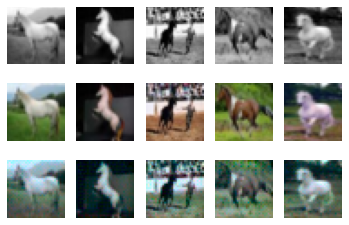

117 tensor(0.6937) tensor(1.3863)


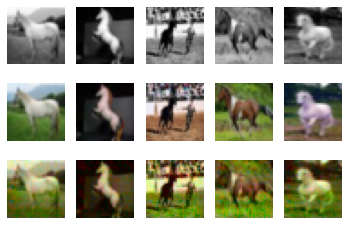

118 tensor(0.6930) tensor(1.3872)


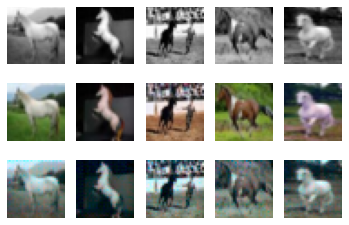

119 tensor(0.6931) tensor(1.3865)


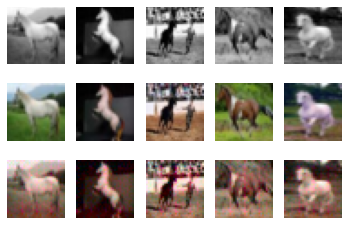

120 tensor(0.6940) tensor(1.3870)


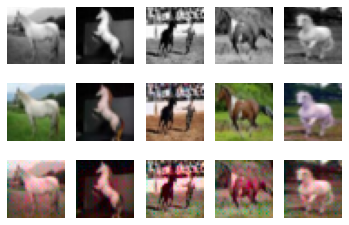

121 tensor(0.6933) tensor(1.3861)


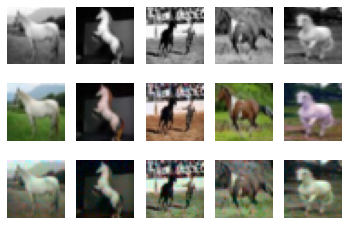

122 tensor(0.6921) tensor(1.3860)


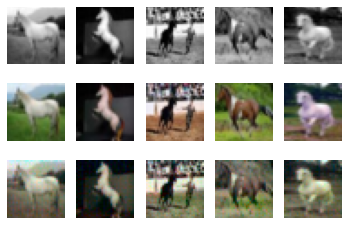

123 tensor(0.6927) tensor(1.3866)


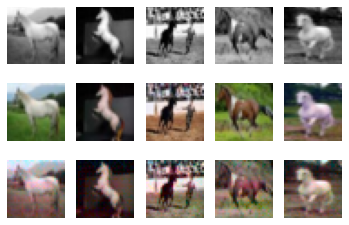

124 tensor(0.6938) tensor(1.3860)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 79 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


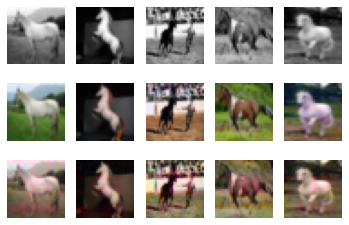

125 tensor(0.6935) tensor(1.3868)


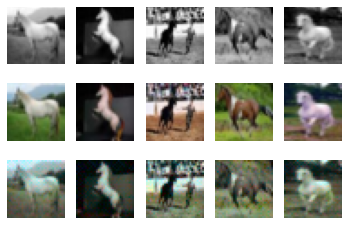

126 tensor(0.6932) tensor(1.3852)


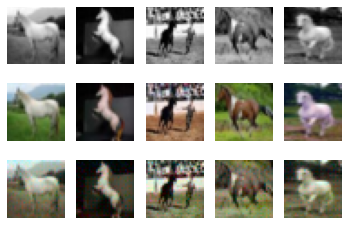

127 tensor(0.6931) tensor(1.3857)


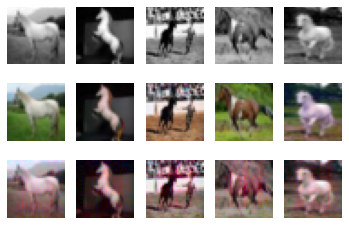

128 tensor(0.6928) tensor(1.3864)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 49 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


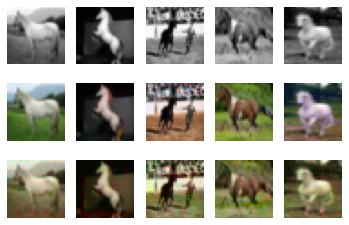

129 tensor(0.6929) tensor(1.3860)


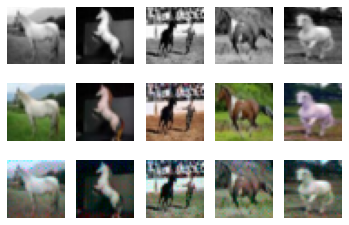

130 tensor(0.6932) tensor(1.3866)


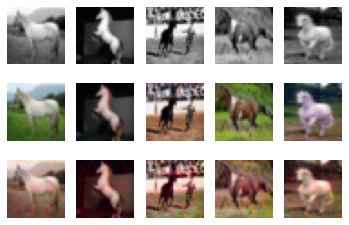

131 tensor(0.6930) tensor(1.3858)


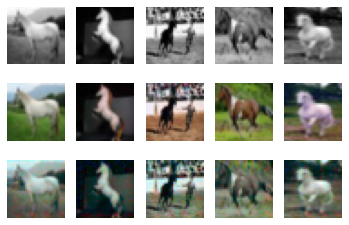

132 tensor(0.6935) tensor(1.3870)


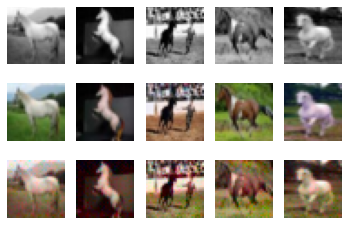

133 tensor(0.6940) tensor(1.3865)


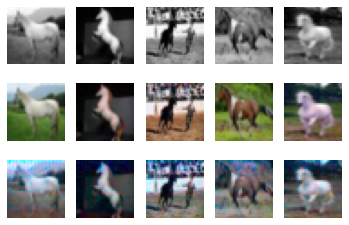

134 tensor(0.6929) tensor(1.3851)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 29 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


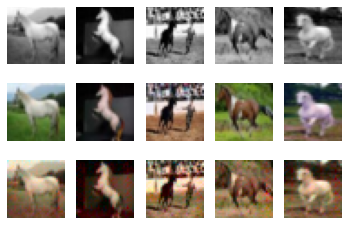

135 tensor(0.6927) tensor(1.3860)


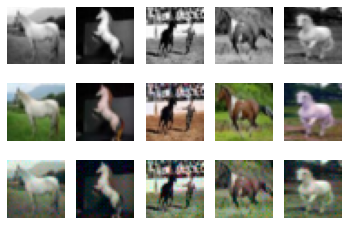

136 tensor(0.6943) tensor(1.3867)


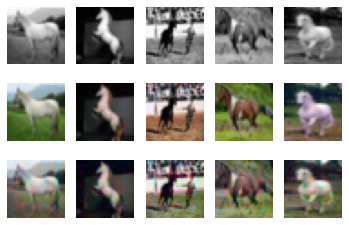

137 tensor(0.6932) tensor(1.3865)


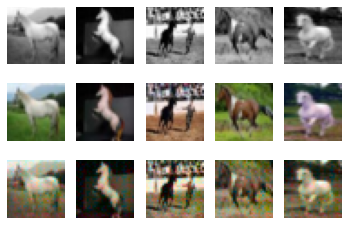

138 tensor(0.6926) tensor(1.3864)


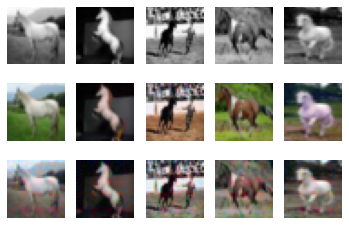

139 tensor(0.6936) tensor(1.3864)


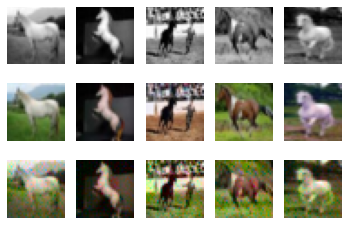

140 tensor(0.6934) tensor(1.3865)


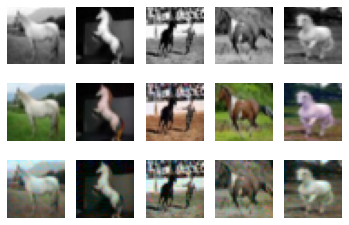

141 tensor(0.6923) tensor(1.3866)


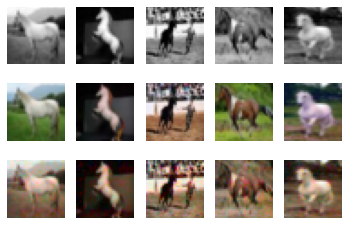

142 tensor(0.6928) tensor(1.3867)


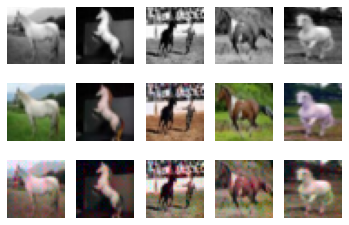

143 tensor(0.6929) tensor(1.3862)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 35 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


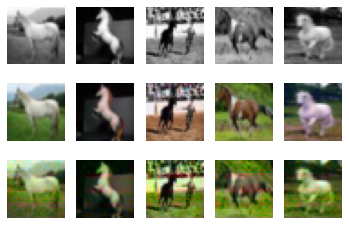

144 tensor(0.6924) tensor(1.3861)


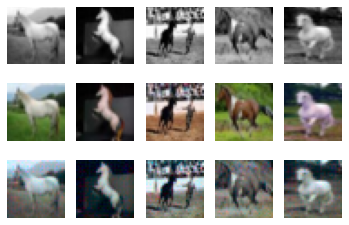

145 tensor(0.6931) tensor(1.3867)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 23 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


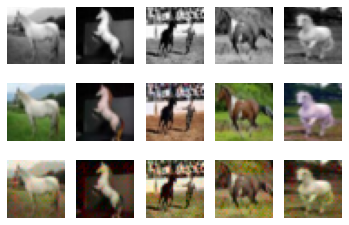

146 tensor(0.6926) tensor(1.3864)


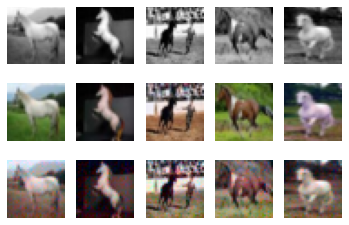

147 tensor(0.6929) tensor(1.3882)


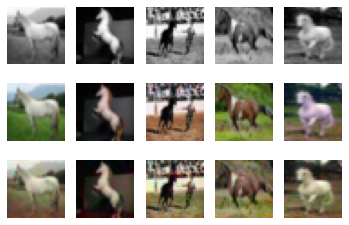

148 tensor(0.6926) tensor(1.3864)


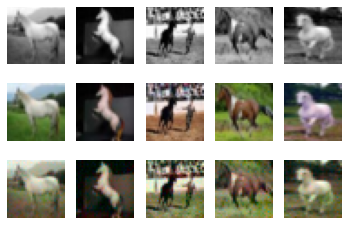

149 tensor(0.6929) tensor(1.3868)


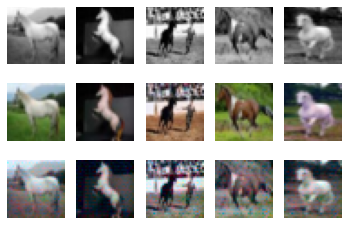

150 tensor(0.6932) tensor(1.3877)


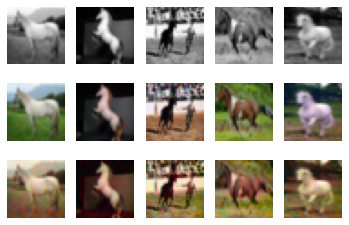

151 tensor(0.6921) tensor(1.3850)


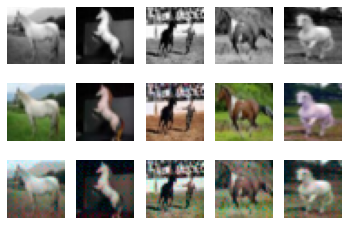

152 tensor(0.6930) tensor(1.3872)


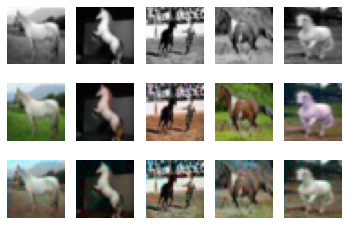

153 tensor(0.6919) tensor(1.3867)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 32 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


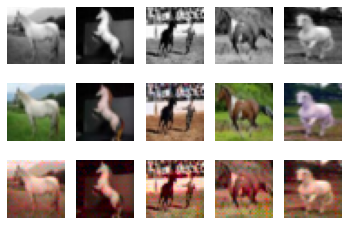

154 tensor(0.6925) tensor(1.3851)


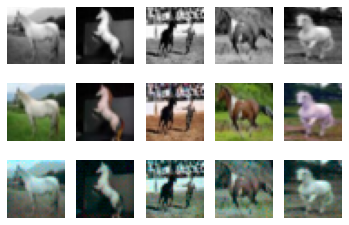

155 tensor(0.6918) tensor(1.3872)


/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


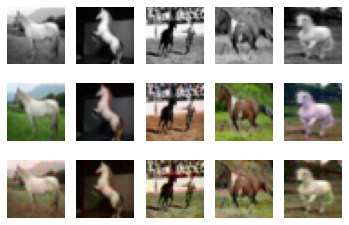

156 tensor(0.6926) tensor(1.3876)


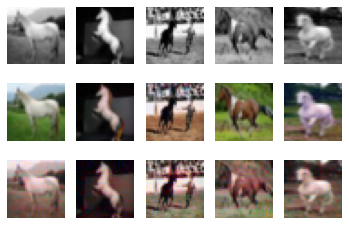

157 tensor(0.6930) tensor(1.3874)


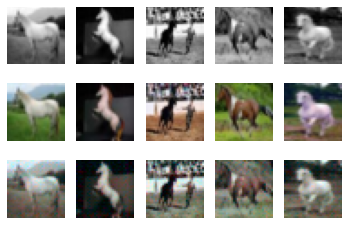

158 tensor(0.6933) tensor(1.3877)


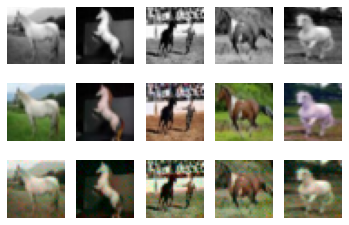

159 tensor(0.6928) tensor(1.3871)


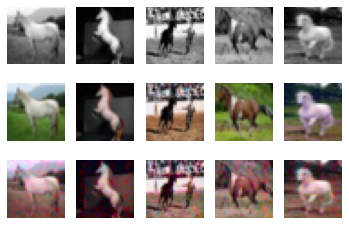

In [ ]:
args = AttrDict()
args_dict = {
    "gpu": True,
    "valid": False,
    "checkpoint": "",
    "colours": "./data/colours/colour_kmeans24_cat7.npy",
    "model": "Generator_lab",
    "kernel": 3,
    "num_filters": 32,
    'learn_rate':0.001, 
    "batch_size": 50,
    "epochs": 160,
    "seed": 1,
    "plot": False,
    "experiment_name": "colourization_gan_lab",
    "visualize": False,
    "downsize_input": False,
}
args.update(args_dict)
cnn = train_gan_lab(args)

Epochs with decent output quality: 87, 96, 113, 138


## Test on New Data
Retrieve sample pictures from online

In [ ]:
#this part the model is tested on validation set and greyscale images of horse from 
#kaggle https://www.kaggle.com/suyashdamle/cyclegan
g_net=Generator_lab(kernel=3, num_filters=32)
d_net=Discriminator_lab(kernel=3, num_filters=32)
model_path_eval_g = get_model_name('Generator_lab', epoch=138)
model_path_eval_d = get_model_name('discriminator_lab', epoch=138)
state_1 = torch.load(model_path_eval_g)
g_net.load_state_dict(state_1)
state_2 = torch.load(model_path_eval_d)
d_net.load_state_dict(state_2)

<All keys matched successfully>

In [ ]:
(x_train, y_train), (x_test, y_test) = load_cifar10()

test_ab, test_grey = process_lab(x_test, y_test, downsize_input=args.downsize_input)

File path: data/cifar-10-batches-py.tar.gz


In [ ]:
def evaluate_lab(gen,dis,test_grey, test_ab):
    total_loss_d = 0.0
    total_loss_g = 0.0
    total_accuracy = 0.0
    total_epoch = 0
    criterion = nn.BCELoss()
    for i, (xs, ys) in enumerate(get_batch_lab(test_grey, test_ab,50)):
      images, lab = get_torch_vars(xs, ys)
      img_grey = images
      img_real = lab
      batch_size = 50
      
      fake_images = gen(img_grey)
      fake_validity = dis(fake_images, img_grey)
      fake_loss = criterion(fake_validity, Variable(torch.zeros(batch_size)))
      real_validity = dis(img_real, img_grey)
      real_loss = criterion(real_validity, Variable(torch.ones(batch_size)))   
      d_loss = real_loss + fake_loss

      g_loss = criterion(fake_validity, Variable(torch.ones(batch_size)))
      
      total_loss_d += d_loss.item()
      total_loss_g += g_loss.item()

    loss_d = float(total_loss_d) / (i + 1)
    loss_g = float(total_loss_g) / (i + 1)
    img_grey = img_grey.cpu().detach().numpy()
    img_lab = img_real.cpu().detach().numpy()
    img_fake = fake_images.cpu().detach().numpy()
    pic_1 = np.zeros((batch_size,3,32,32))
    pic_1[:,0:1,:,:]=(img_grey+1.)*50.
    pic_1[:,1:3,:,:]=img_lab*110.
    img_real=lab2rgb(np.transpose(pic_1,[0,2,3,1]))
    pic_2 = np.zeros((batch_size,3,32,32))
    pic_2[:,0:1,:,:]=(img_grey+1.)*50.
    pic_2[:,1:3,:,:]=img_fake*110.
    img_fake=lab2rgb(np.transpose(pic_2,[0,2,3,1]))
    #correct image structure
    img_grey = np.transpose(img_grey[:5, :, :, :], [0, 2, 3, 1]).squeeze()
    img_real = img_real[:5, :, :, :]
    img_fake = img_fake[:5, :, :, :]
    for i in range(5):
      ax = plt.subplot(3, 5, i + 1)
      ax.imshow(img_grey[i], cmap='gray')
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 5)
      ax.imshow(img_real[i])
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 10)
      ax.imshow(img_fake[i])
      ax.axis("off")
    plt.show()

    return loss_d, loss_g


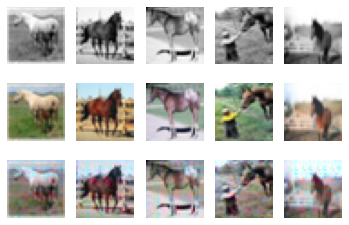

In [ ]:
loss_d, loss_g =evaluate_lab(g_net,d_net,test_grey, test_ab)

In [ ]:
print('Loss_d:',loss_d)
print('Loss_g:',loss_g)

Loss_d: 1.3860849678516387
Loss_g: 0.6931809574365616


In [ ]:
from torchvision import datasets, transforms
from zipfile import ZipFile

with ZipFile('Horse_data_new.zip', 'r') as zipObj:
   zipObj.extractall() 

In [ ]:
import glob
from PIL import Image 
images_h = []
for f in glob.iglob("Horse_data_new/Horse/*"):
    images_h.append(np.asarray(Image.open(f).resize((32,32))))

data_horse = np.array(images_h)

In [ ]:
def process_lab_new(xs, downsize_input=False):

    npr.shuffle(xs)
    lab = rgb2lab(xs)
    l = lab[:,:,:,0:1] / 50. - 1.
    ab = lab[:,:,:,1:3] / 110.
    l = np.transpose(l,[0,3,1,2])
    ab = np.transpose(ab,[0,3,1,2])
    return (ab, l)

In [ ]:
test_lab, test_g = process_lab_new(data_horse)

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


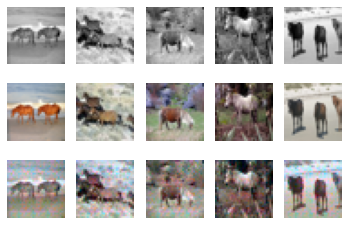

In [ ]:
loss_d1, loss_g1 =evaluate_lab(g_net,d_net,test_g, test_lab)